<center><b><u><font size="6">CREDIT CARD FRAUD DETECTION</font></u></b></center>

![Credit card](creditcard.jpg)

# Introduction

Credit card fraud is a growing concern in the digital age, and Python offers a powerful toolset for combating it. In this project, we utilize a dataset of historical credit card transactions to build a fraud detection system. We'll preprocess the data, conduct exploratory analysis, engineer features, and train various machine learning models to distinguish between legitimate and fraudulent transactions. By evaluating these models, we aim to create an effective and accurate fraud detection system. This project highlights how Python's capabilities can be harnessed to enhance the security and reliability of online financial transactions, benefiting both financial institutions and consumers.

# Import libraries

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objs as go
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.graph_objects as go
from plotly.subplots import make_subplots  # Import make_subplots correctly

# Import dataset

In [2]:
df = pd.read_csv("creditcard.csv")
df.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,...,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,...,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,...,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,...,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,...,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


# Data Exploration

In [3]:
# check shape of dataset
df.shape

(284807, 31)

We can see here 284807 rows and 31 columns in dataset

In [4]:
# check basic information of dataset
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [5]:
# check statistical description of dataset
df.describe()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,...,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
count,284807.000000,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,...,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,2.848070e+05,284807.000000,284807.000000
mean,94813.859575,1.168375e-15,3.416908e-16,-1.379537e-15,2.074095e-15,9.604066e-16,1.487313e-15,-5.556467e-16,1.213481e-16,-2.406331e-15,...,1.654067e-16,-3.568593e-16,2.578648e-16,4.473266e-15,5.340915e-16,1.683437e-15,-3.660091e-16,-1.227390e-16,88.349619,0.001727
std,47488.145955,1.958696e+00,1.651309e+00,1.516255e+00,1.415869e+00,1.380247e+00,1.332271e+00,1.237094e+00,1.194353e+00,1.098632e+00,...,7.345240e-01,7.257016e-01,6.244603e-01,6.056471e-01,5.212781e-01,4.822270e-01,4.036325e-01,3.300833e-01,250.120109,0.041527
min,0.000000,-5.640751e+01,-7.271573e+01,-4.832559e+01,-5.683171e+00,-1.137433e+02,-2.616051e+01,-4.355724e+01,-7.321672e+01,-1.343407e+01,...,-3.483038e+01,-1.093314e+01,-4.480774e+01,-2.836627e+00,-1.029540e+01,-2.604551e+00,-2.256568e+01,-1.543008e+01,0.000000,0.000000
25%,54201.500000,-9.203734e-01,-5.985499e-01,-8.903648e-01,-8.486401e-01,-6.915971e-01,-7.682956e-01,-5.540759e-01,-2.086297e-01,-6.430976e-01,...,-2.283949e-01,-5.423504e-01,-1.618463e-01,-3.545861e-01,-3.171451e-01,-3.269839e-01,-7.083953e-02,-5.295979e-02,5.600000,0.000000
50%,84692.000000,1.810880e-02,6.548556e-02,1.798463e-01,-1.984653e-02,-5.433583e-02,-2.741871e-01,4.010308e-02,2.235804e-02,-5.142873e-02,...,-2.945017e-02,6.781943e-03,-1.119293e-02,4.097606e-02,1.659350e-02,-5.213911e-02,1.342146e-03,1.124383e-02,22.000000,0.000000
75%,139320.500000,1.315642e+00,8.037239e-01,1.027196e+00,7.433413e-01,6.119264e-01,3.985649e-01,5.704361e-01,3.273459e-01,5.971390e-01,...,1.863772e-01,5.285536e-01,1.476421e-01,4.395266e-01,3.507156e-01,2.409522e-01,9.104512e-02,7.827995e-02,77.165000,0.000000
max,172792.000000,2.454930e+00,2.205773e+01,9.382558e+00,1.687534e+01,3.480167e+01,7.330163e+01,1.205895e+02,2.000721e+01,1.559499e+01,...,2.720284e+01,1.050309e+01,2.252841e+01,4.584549e+00,7.519589e+00,3.517346e+00,3.161220e+01,3.384781e+01,25691.160000,1.000000


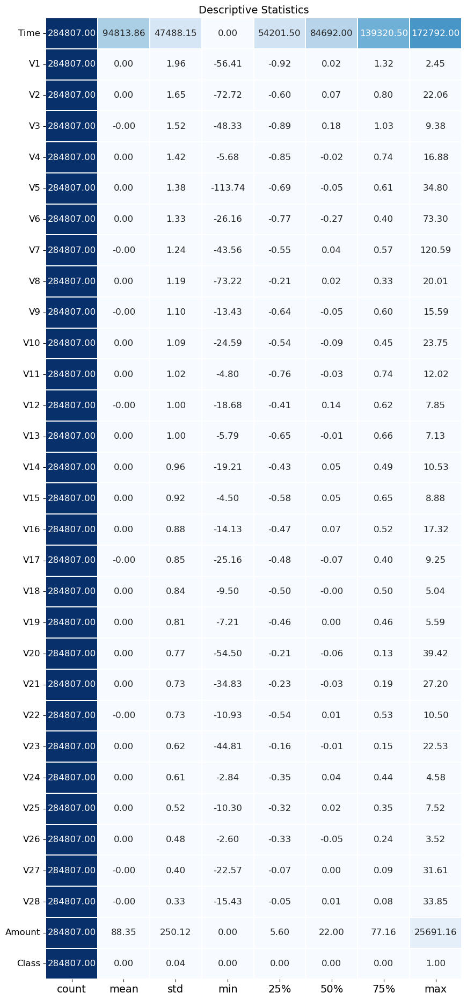

In [6]:
def desc_stats(dataframe):
    desc = dataframe.describe().T
    f, ax = plt.subplots(figsize=(10, desc.shape[0] * 0.75))
    sns.heatmap(desc,
                annot=True,
                cmap='Blues',  # Using 'Blues' colormap directly
                fmt='.2f',
                ax=ax,
                linecolor='white',
                linewidths=1.3,
                cbar=False,
                annot_kws={"size": 12})
    plt.xticks(size=14)
    plt.yticks(size=12, rotation=0)
    plt.title("Descriptive Statistics", size=14)
    plt.show()

desc_stats(df)


The desc_stats function generates a heatmap displaying essential descriptive statistics for a DataFrame, aiding in data exploration and understanding. It highlights the central tendency through mean values, data variability via standard deviation, data range with min and max values, and distribution shape via percentiles. Additionally, it reveals data completeness by showing the count of non-null values in each column. This visualization provides quick insights into your dataset's characteristics, helping you identify patterns, outliers, and potential correlations, which can inform data analysis and decision-making processes effectively.

In [7]:
# correlation matrix
corr = df.corr()
corr.style.background_gradient(cmap='summer_r')

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
Time,1.000000,0.117396,-0.010593,-0.419618,-0.105260,0.173072,-0.063016,0.084714,-0.036949,-0.008660,0.030617,-0.247689,0.124348,-0.065902,-0.098757,-0.183453,0.011903,-0.073297,0.090438,0.028975,-0.050866,0.044736,0.144059,0.051142,-0.016182,-0.233083,-0.041407,-0.005135,-0.009413,-0.010596,-0.012323
V1,0.117396,1.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.227709,-0.101347
V2,-0.010593,0.000000,1.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.531409,0.091289
V3,-0.419618,-0.000000,0.000000,1.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.210880,-0.192961
V4,-0.105260,-0.000000,-0.000000,0.000000,1.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.098732,0.133447
V5,0.173072,0.000000,0.000000,-0.000000,-0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.386356,-0.094974
V6,-0.063016,-0.000000,0.000000,0.000000,-0.000000,0.000000,1.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,0.215981,-0.043643
V7,0.084714,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,0.000000,0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.397311,-0.187257
V8,-0.036949,-0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,0.000000,1.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,-0.000000,0.000000,0.000000,0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.103079,0.019875
V9,-0.008660,-0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,-0.000000,0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,-0.000000,0.000000,-0.000000,-0.000000,0.000000,-0.044246,-0.097733


Correlation matrix for the dataset and uses color intensity to represent the strength and direction of relationships between variables. Dark green indicates positive correlations, dark red suggests negative correlations, and pale yellow signifies little to no correlation. This visualization helps identify important relationships and potential redundancies among variables, guiding data exploration and feature selection. However, it's essential to remember that correlation does not imply causation, and further analysis is needed to establish causal relationships.

In [8]:
# check any null values present in dataset or not
df.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

Here we can see no null values present in dataset so no need for data cleaning and all the data types are also correct according to data so no need to make changes to that also. In case there are some missing values present pr data types are not correct then we can do data cleaning.

# Data Visualization

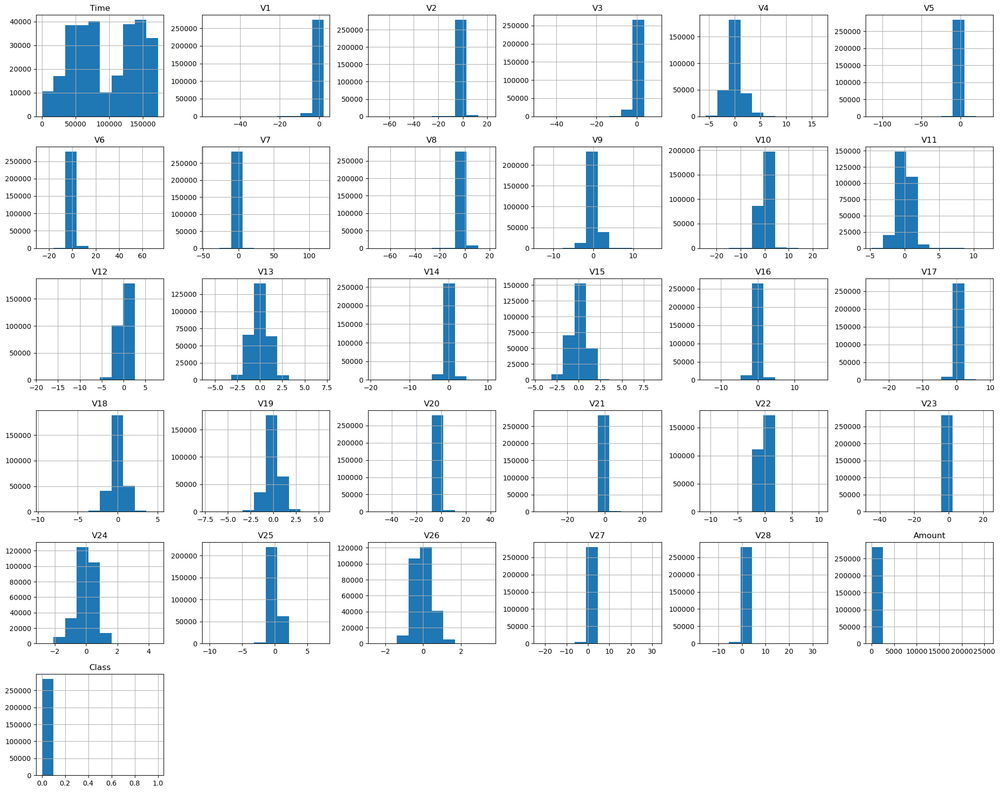

In [9]:
# Plot histograms of each parameter 
df.hist(figsize = (25, 20))
plt.show()

Plotting histograms for each parameter in your DataFrame df provides valuable insights into the data's distribution, spread, and potential outliers. You can discern the shape of each parameter's distribution, whether it's symmetric, skewed, or multimodal. Additionally, the histograms help you identify the range of values, assess data completeness, and gauge data variability. These visualizations are essential for understanding your dataset's fundamental characteristics, guiding data preprocessing, and informing the selection of appropriate statistical analyses.

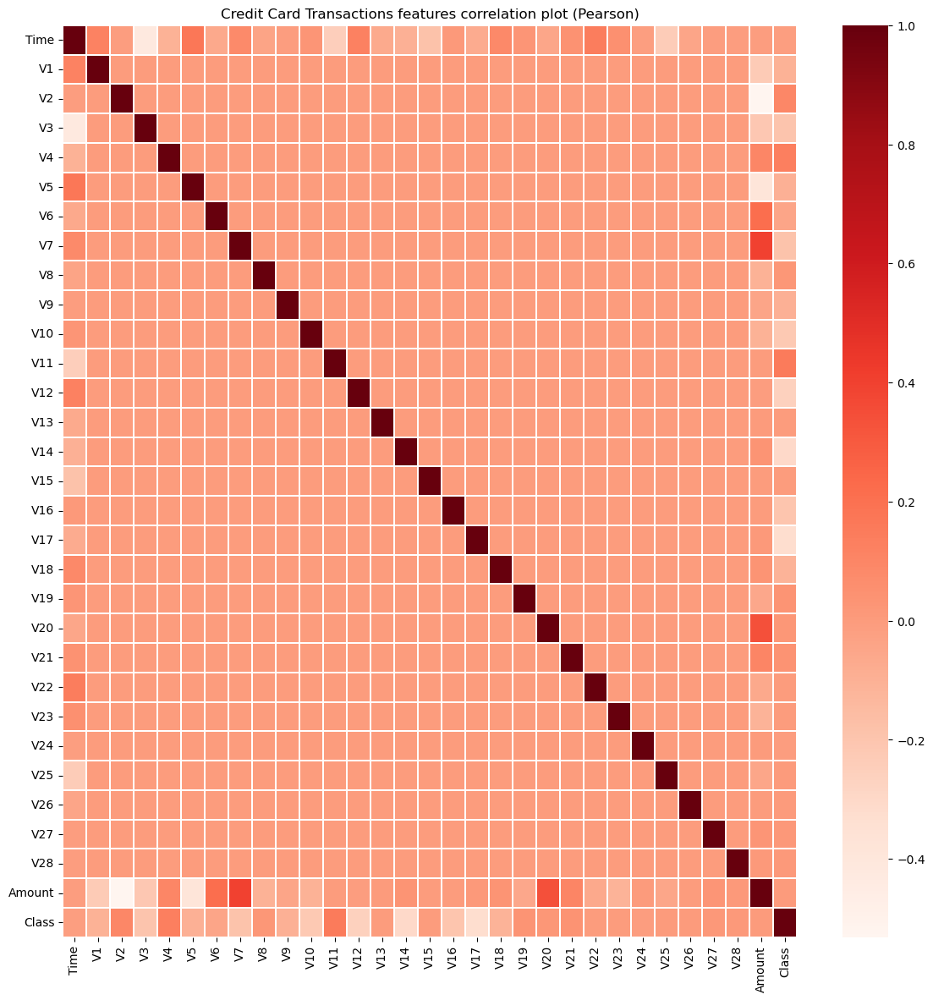

In [10]:
# correlation heatmap:
plt.figure(figsize = (14,14))
plt.title('Credit Card Transactions features correlation plot (Pearson)')
corr = df.corr()
sns.heatmap(corr,xticklabels=corr.columns,yticklabels=corr.columns,linewidths=.1,cmap="Reds")
plt.show()

In the above HeatMap we can clearly see that most of the features do not correlate to other features but there are some features that either has a positive or a negative correlation with each other. For example, V2 and V5 are highly negatively correlated with the feature called Amount. We also see some correlation with V20 and V7 with Amount.

In [11]:
df['Hour'] = df['Time'] 
count_0 = df[df['Class'] == 0].groupby('Hour').count()["Class"]
count_1 = df[df['Class'] == 1].groupby('Hour').count()["Class"]

counts_df = pd.concat([count_0, count_1], axis=1, keys=["Non-Fraudulent", "Fraudulent"]).fillna(0)
df_counts = counts_df.reset_index()

fig = make_subplots(
    rows=1, cols=2,
    subplot_titles=("Non-Fraudulent Transactions", "Fraudulent Transactions")
)
fig.add_trace(
    go.Scatter(x=df_counts["Hour"], y=df_counts["Non-Fraudulent"], name="Transactions", marker={'color': "#1E90FF"}),
    row=1, col=1
)
fig.add_trace(
    go.Scatter(x=df_counts["Hour"], y=df_counts["Fraudulent"], name="Transactions", marker={'color': "#FF4500"}),
    row=1, col=2
)

fig['layout']['xaxis']['title'] = 'Hour'
fig['layout']['yaxis']['title'] = 'Transaction Count'
fig['layout']['xaxis2']['title'] = 'Hour'
fig['layout']['yaxis2']['title'] = 'Transaction Count'

fig.show()


This code utilizes Plotly to create two plots displaying the hourly transaction counts for both non-fraudulent and fraudulent credit card transactions. By comparing these plots, it's easy to identify hourly patterns and potential anomalies. This visualization can help in detecting unusual activity, understanding transaction behavior over time, and making informed decisions for fraud detection and prevention.

# Check Correlation of Class feature.

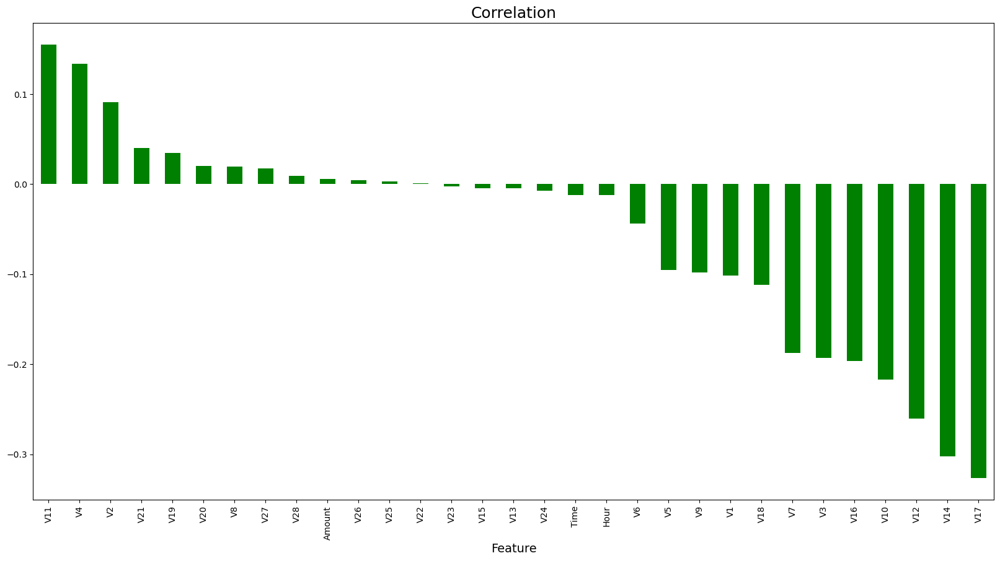

In [12]:
plt.figure(figsize=(20,10))
df.corr()['Class'].sort_values(ascending=False).drop(['Class']).plot(kind='bar', color='g')
plt.xlabel("Feature",fontsize=14)
plt.title("Correlation",fontsize=18)
plt.show()

We can see here V11 , V4, V2 has positive correlation with Class and V10, V12, V14 and V17 has negetively correlated with Class.

# Now Lets Check Distribution of Class feature.

In [13]:
classes = df['Class'].value_counts()
classes

0    284315
1       492
Name: Class, dtype: int64

In [14]:
normal_share = round((classes[0]/df['Class'].count()*100),2)
normal_share

99.83

In [15]:
fraud_share = round((classes[1]/df['Class'].count()*100),2)
fraud_share

0.17

We can see that there is only 0.17% frauds.

# Observe the distribution of classes with time

In [16]:
# Creating fraudulent dataframe
data_fraud = df[df['Class'] == 1]

# Creating non fraudulent dataframe
data_non_fraud = df[df['Class'] == 0]

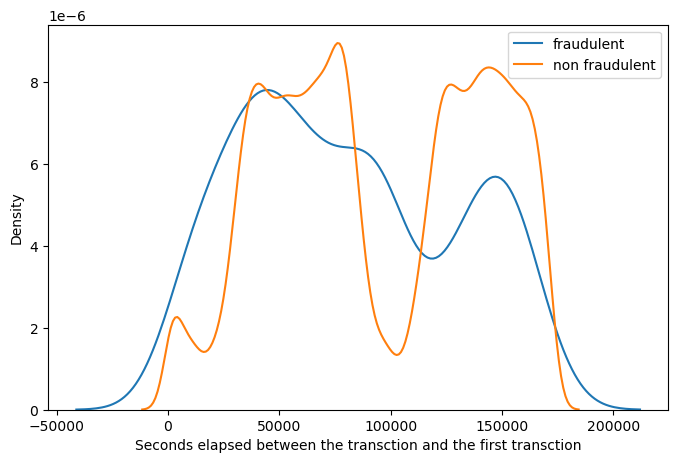

In [17]:
# Distribution plot
plt.figure(figsize=(8,5))

ax = sns.distplot(data_fraud['Time'],label='fraudulent', hist=False)
ax = sns.distplot(data_non_fraud['Time'],label='non fraudulent', hist=False)

ax.set(xlabel='Seconds elapsed between the transction and the first transction')
ax.legend()

plt.show()

We do not see any specific pattern for the fraudulent and non-fraudulent transctions with respect to Time.

# Partitioning the dataset into two distinct sets 

In [19]:
from sklearn.model_selection import train_test_split
X=df.drop(["Class"],axis=1).values
y=df["Class"].values
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)



In [20]:
from sklearn.preprocessing import StandardScaler

# Split your data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Standardize the data
sc = StandardScaler()
X_train = sc.fit_transform(X_train)
X_test = sc.transform(X_test)


# Model Building

In [21]:
from scipy import stats
from scipy.stats import norm, skew
from sklearn.preprocessing import LabelEncoder, OneHotEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.preprocessing import RobustScaler 
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score
from sklearn.metrics import confusion_matrix, accuracy_score, classification_report
from sklearn.metrics import mean_absolute_error,mean_squared_error,r2_score,f1_score
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, AdaBoostClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from xgboost import XGBClassifier
from lightgbm import LGBMClassifier
from catboost import CatBoostClassifier

In [22]:
# model building

knn=KNeighborsClassifier()
svc=SVC()
nb=GaussianNB()
dtc=DecisionTreeClassifier()
rfc=RandomForestClassifier()
xgb=XGBClassifier()
lgb=LGBMClassifier()
gbc=GradientBoostingClassifier()
abc=AdaBoostClassifier()
lr=LogisticRegression()


models = [knn, svc, nb, dtc, rfc, xgb, lgb, gbc, abc, lr]

for model in models:
    model.fit(X_train, y_train)
    y_pred = model.predict(X_test)
    print(type(model).__name__, "Model Test Accuracy Score is: ", accuracy_score(y_test, y_pred))
    print(type(model).__name__, "Model Test F1 Score is: ", f1_score(y_test, y_pred))
    print(type(model).__name__,"Mean_absolute_error: ",mean_absolute_error(y_test, y_pred))
    print(type(model).__name__,"Mean_squared_error: ",mean_squared_error(y_test, y_pred))
    print(type(model).__name__,"Root_mean_squared_error: ",np.sqrt(mean_squared_error(y_test, y_pred)))
    print(type(model).__name__,"R2_score: ",r2_score(y_test, y_pred))
    print(type(model).__name__,"Classification_report: \n",classification_report(y_test, y_pred))
    fig=px.imshow(confusion_matrix(y_test, y_pred),color_continuous_scale="Viridis",title=type(model).__name__,
                  width=400,height=400,labels=dict(x="Predicted", y="Actual", color="Counts"),template="plotly_dark")
    fig.show()

KNeighborsClassifier Model Test Accuracy Score is:  0.9995259997893332
KNeighborsClassifier Model Test F1 Score is:  0.8491620111731844
KNeighborsClassifier Mean_absolute_error:  0.00047400021066676027
KNeighborsClassifier Mean_squared_error:  0.00047400021066676027
KNeighborsClassifier Root_mean_squared_error:  0.021771545895199088
KNeighborsClassifier R2_score:  0.724014978810883
KNeighborsClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.94      0.78      0.85        98

    accuracy                           1.00     56962
   macro avg       0.97      0.89      0.92     56962
weighted avg       1.00      1.00      1.00     56962



SVC Model Test Accuracy Score is:  0.9993153330290369
SVC Model Test F1 Score is:  0.7577639751552796
SVC Mean_absolute_error:  0.0006846669709630982
SVC Mean_squared_error:  0.0006846669709630982
SVC Root_mean_squared_error:  0.026166141690419285
SVC R2_score:  0.6013549693934976
SVC Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.97      0.62      0.76        98

    accuracy                           1.00     56962
   macro avg       0.98      0.81      0.88     56962
weighted avg       1.00      1.00      1.00     56962



GaussianNB Model Test Accuracy Score is:  0.9778975457322425
GaussianNB Model Test F1 Score is:  0.1127554615926709
GaussianNB Mean_absolute_error:  0.022102454267757452
GaussianNB Mean_squared_error:  0.022102454267757452
GaussianNB Root_mean_squared_error:  0.1486689418397718
GaussianNB R2_score:  -11.869079321374015
GaussianNB Classification_report: 
               precision    recall  f1-score   support

           0       1.00      0.98      0.99     56864
           1       0.06      0.82      0.11        98

    accuracy                           0.98     56962
   macro avg       0.53      0.90      0.55     56962
weighted avg       1.00      0.98      0.99     56962



DecisionTreeClassifier Model Test Accuracy Score is:  0.9990344440153085
DecisionTreeClassifier Model Test F1 Score is:  0.7317073170731707
DecisionTreeClassifier Mean_absolute_error:  0.0009655559846915488
DecisionTreeClassifier Mean_squared_error:  0.0009655559846915488
DecisionTreeClassifier Root_mean_squared_error:  0.031073396735657156
DecisionTreeClassifier R2_score:  0.4378082901703171
DecisionTreeClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.70      0.77      0.73        98

    accuracy                           1.00     56962
   macro avg       0.85      0.88      0.87     56962
weighted avg       1.00      1.00      1.00     56962



RandomForestClassifier Model Test Accuracy Score is:  0.9995962220427653
RandomForestClassifier Model Test F1 Score is:  0.8700564971751412
RandomForestClassifier Mean_absolute_error:  0.00040377795723464763
RandomForestClassifier Mean_squared_error:  0.00040377795723464763
RandomForestClassifier Root_mean_squared_error:  0.020094226962852978
RandomForestClassifier R2_score:  0.7649016486166781
RandomForestClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.97      0.79      0.87        98

    accuracy                           1.00     56962
   macro avg       0.99      0.89      0.93     56962
weighted avg       1.00      1.00      1.00     56962



XGBClassifier Model Test Accuracy Score is:  0.9996137776061234
XGBClassifier Model Test F1 Score is:  0.8750000000000001
XGBClassifier Mean_absolute_error:  0.0003862223938766195
XGBClassifier Mean_squared_error:  0.0003862223938766195
XGBClassifier Root_mean_squared_error:  0.019652541664543534
XGBClassifier R2_score:  0.7751233160681268
XGBClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.99      0.79      0.88        98

    accuracy                           1.00     56962
   macro avg       0.99      0.89      0.94     56962
weighted avg       1.00      1.00      1.00     56962



[LightGBM] [Info] Number of positive: 394, number of negative: 227451
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.024921 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 7905
[LightGBM] [Info] Number of data points in the train set: 227845, number of used features: 31
[LightGBM] [Info] [binary:BoostFromScore]: pavg=0.001729 -> initscore=-6.358339
[LightGBM] [Info] Start training from score -6.358339
LGBMClassifier Model Test Accuracy Score is:  0.9969453319757031
LGBMClassifier Model Test F1 Score is:  0.4
LGBMClassifier Mean_absolute_error:  0.0030546680242968995
LGBMClassifier Mean_squared_error:  0.0030546680242968995
LGBMClassifier Root_mean_squared_error:  0.05526905123391299
LGBMClassifier R2_score:  -0.7785701365520878
LGBMClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.

GradientBoostingClassifier Model Test Accuracy Score is:  0.9989466661985184
GradientBoostingClassifier Model Test F1 Score is:  0.6629213483146067
GradientBoostingClassifier Mean_absolute_error:  0.0010533338014816894
GradientBoostingClassifier Mean_squared_error:  0.0010533338014816894
GradientBoostingClassifier Root_mean_squared_error:  0.032455104397947784
GradientBoostingClassifier R2_score:  0.38669995291307313
GradientBoostingClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.74      0.60      0.66        98

    accuracy                           1.00     56962
   macro avg       0.87      0.80      0.83     56962
weighted avg       1.00      1.00      1.00     56962



AdaBoostClassifier Model Test Accuracy Score is:  0.9993153330290369
AdaBoostClassifier Model Test F1 Score is:  0.7845303867403315
AdaBoostClassifier Mean_absolute_error:  0.0006846669709630982
AdaBoostClassifier Mean_squared_error:  0.0006846669709630982
AdaBoostClassifier Root_mean_squared_error:  0.026166141690419285
AdaBoostClassifier R2_score:  0.6013549693934976
AdaBoostClassifier Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.86      0.72      0.78        98

    accuracy                           1.00     56962
   macro avg       0.93      0.86      0.89     56962
weighted avg       1.00      1.00      1.00     56962



LogisticRegression Model Test Accuracy Score is:  0.9991222218320986
LogisticRegression Model Test F1 Score is:  0.6951219512195121
LogisticRegression Mean_absolute_error:  0.0008777781679014079
LogisticRegression Mean_squared_error:  0.0008777781679014079
LogisticRegression Root_mean_squared_error:  0.029627321308235206
LogisticRegression R2_score:  0.4889166274275609
LogisticRegression Classification_report: 
               precision    recall  f1-score   support

           0       1.00      1.00      1.00     56864
           1       0.86      0.58      0.70        98

    accuracy                           1.00     56962
   macro avg       0.93      0.79      0.85     56962
weighted avg       1.00      1.00      1.00     56962



The provided code assesses the performance of ten different classification models for fraud detection. Each model is trained and evaluated on test data, and their performance is measured using metrics such as accuracy, F1 score, error metrics, and classification reports. Additionally, confusion matrices are displayed to visualize how well the models classify instances. This comprehensive analysis helps identify the most suitable model for your specific fraud detection task, considering factors like precision, recall, and overall accuracy. It aids in selecting the model that strikes the right balance between detecting fraudulent transactions and minimizing false alarms.

In [23]:
# comparing all model accuracy:   

models = [knn, svc, nb, dtc, rfc, xgb, lgb, gbc, abc, lr]

fig=px.bar(x=[type(model).__name__ for model in models], y=[accuracy_score(y_test, model.predict(X_test)) for model in models],
         color=[accuracy_score(y_test, model.predict(X_test)) for model in models], color_continuous_scale="Viridis",
            title="Model Comparison", labels=dict(x="Model", y="Accuracy"), template="plotly_dark", width=800,
            height=600,text=[accuracy_score(y_test, model.predict(X_test)) for model in models])
#fig.update_layout(yaxis_range=[0.97,0.99]) 
fig.show()

As we can clearly see that after comparing all models we get 99% accuracy for every model which is a great thing and our model is running perfectly. 

# AUC-ROC CURVE

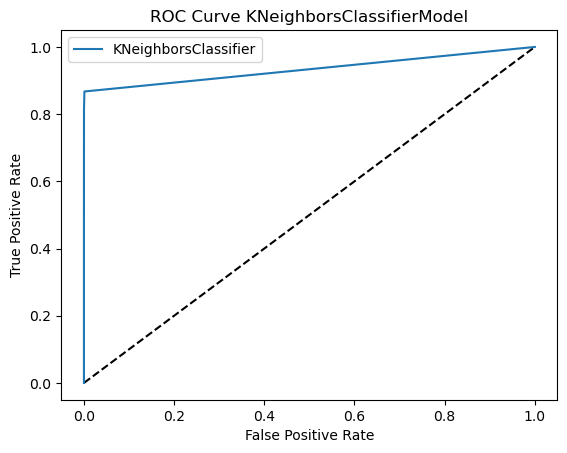

KNeighborsClassifier Model AUC Score is:  0.9335527911924477


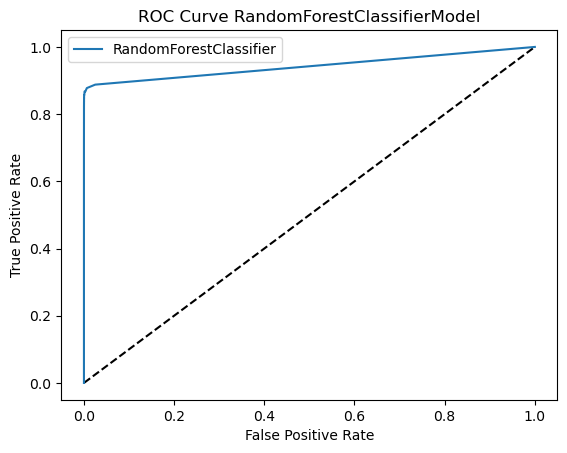

RandomForestClassifier Model AUC Score is:  0.9422477224570188


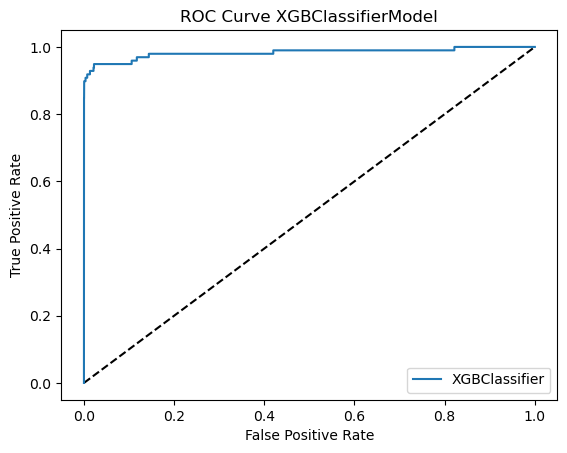

XGBClassifier Model AUC Score is:  0.9828708741515739


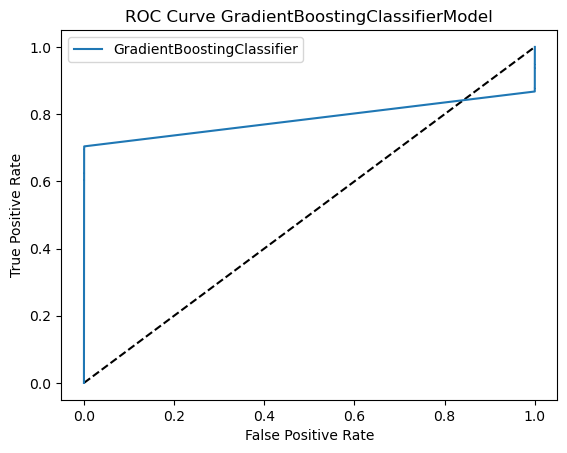

GradientBoostingClassifier Model AUC Score is:  0.7855107029446556


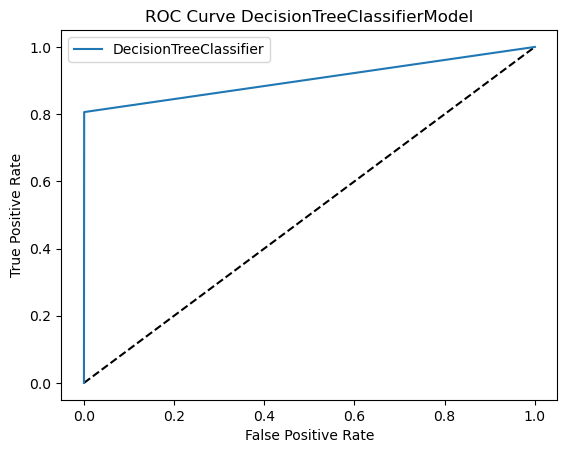

DecisionTreeClassifier Model AUC Score is:  0.9028062301172579


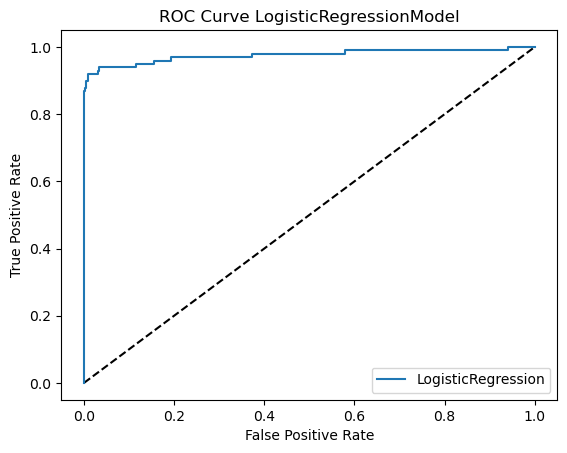

LogisticRegression Model AUC Score is:  0.9747625555568317


In [76]:
from sklearn.metrics import roc_curve, auc

models = [knn, rfc, xgb, gbc, dtc, lr]

for model in models:
    y_pred_prob = model.predict_proba(X_test)[:, 1]
    fpr, tpr, thresholds = roc_curve(y_test, y_pred_prob)
    plt.plot([0, 1], [0, 1], "k--")
    plt.plot(fpr, tpr, label=type(model).__name__)
    plt.xlabel("False Positive Rate")
    plt.ylabel("True Positive Rate")
    plt.title("ROC Curve "+type(model).__name__+"Model")
    plt.legend()
    plt.show()
    print(type(model).__name__, "Model AUC Score is: ", auc(fpr, tpr))

The performance of various machine learning models for fraud detection by generating ROC curves and calculating AUC scores. These visualizations and scores allow for a comparative analysis of each model's ability to distinguish between fraudulent and non-fraudulent transactions. Higher AUC scores typically indicate better discrimination capability. Insights gained include model suitability, variability in performance, and the potential for threshold optimization. This analysis aids in selecting the most effective model and threshold for the specific fraud detection task, prioritizing the identification of actual fraud cases while managing false positives.

# Conclusion:

I investigated the data, checking for data unbalancing, visualizing the features and understanding the relationship between different features. We then investigated ten predictive models. The data was split in 2 parts, a train set and a test set.

I have evaluated the performance of the models using the AUC-ROC curve and other metrics. The best results were obtained with XGBoost, with an AUC score of 0.97 and a accuracy of 0.9996.